<a href="https://colab.research.google.com/github/kmkkkp/2023_2_mogakso/blob/main/udacity_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random

In [ ]:
%cd /content/drive/MyDrive/self_driving
!ls

/content/drive/MyDrive/self_driving
 drive.py   requirements.txt   Untitled0.ipynb		 '제목 없는 문서.gdoc'
 model.h5   track2	      '제목 없는 문서 (1).gdoc'


In [ ]:
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed' ]

data = pd.read_csv('/content/drive/MyDrive/self_driving/track/driving_log.csv' , names = columns)
pd.set_option('display.max_colwidth', -1)
data

<ipython-input-4-8c886f9717dc>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_45_38_025.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_45_38_025.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_45_38_025.jpg,0.0,0.0,0.0,0.000080
1,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_45_38_126.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_45_38_126.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_45_38_126.jpg,0.0,0.0,0.0,0.000078
2,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_45_38_227.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_45_38_227.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_45_38_227.jpg,0.0,0.0,0.0,0.000080
3,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_45_38_330.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_45_38_330.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_45_38_330.jpg,0.0,0.0,0.0,0.000079
4,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_45_38_432.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_45_38_432.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_45_38_432.jpg,0.0,0.0,0.0,0.000079
...,...,...,...,...,...,...,...
2669,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_50_41_270.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_50_41_270.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_50_41_270.jpg,0.0,0.0,0.0,27.387740
2670,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_50_41_373.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_50_41_373.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_50_41_373.jpg,0.0,0.0,0.0,27.112750
2671,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_50_41_475.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_50_41_475.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_50_41_475.jpg,0.0,0.0,0.0,26.840510
2672,C:\Simulator\simulator-windows-64\track\IMG\center_2023_08_21_17_50_41_576.jpg,C:\Simulator\simulator-windows-64\track\IMG\left_2023_08_21_17_50_41_576.jpg,C:\Simulator\simulator-windows-64\track\IMG\right_2023_08_21_17_50_41_576.jpg,0.0,0.0,0.0,26.571010


In [ ]:
import ntpath

def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail


data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

In [ ]:
data

,center,left,right,steering,throttle,reverse,speed
0,center_2023_08_21_17_45_38_025.jpg,left_2023_08_21_17_45_38_025.jpg,right_2023_08_21_17_45_38_025.jpg,0.0,0.0,0.0,0.000080
1,center_2023_08_21_17_45_38_126.jpg,left_2023_08_21_17_45_38_126.jpg,right_2023_08_21_17_45_38_126.jpg,0.0,0.0,0.0,0.000078
2,center_2023_08_21_17_45_38_227.jpg,left_2023_08_21_17_45_38_227.jpg,right_2023_08_21_17_45_38_227.jpg,0.0,0.0,0.0,0.000080
3,center_2023_08_21_17_45_38_330.jpg,left_2023_08_21_17_45_38_330.jpg,right_2023_08_21_17_45_38_330.jpg,0.0,0.0,0.0,0.000079
4,center_2023_08_21_17_45_38_432.jpg,left_2023_08_21_17_45_38_432.jpg,right_2023_08_21_17_45_38_432.jpg,0.0,0.0,0.0,0.000079
...,...,...,...,...,...,...,...
2669,center_2023_08_21_17_50_41_270.jpg,left_2023_08_21_17_50_41_270.jpg,right_2023_08_21_17_50_41_270.jpg,0.0,0.0,0.0,27.387740
2670,center_2023_08_21_17_50_41_373.jpg,left_2023_08_21_17_50_41_373.jpg,right_2023_08_21_17_50_41_373.jpg,0.0,0.0,0.0,27.112750
2671,center_2023_08_21_17_50_41_475.jpg,left_2023_08_21_17_50_41_475.jpg,right_2023_08_21_17_50_41_475.jpg,0.0,0.0,0.0,26.840510
2672,center_2023_08_21_17_50_41_576.jpg,left_2023_08_21_17_50_41_576.jpg,right_2023_08_21_17_50_41_576.jpg,0.0,0.0,0.0,26.571010


In [ ]:
num_bins = 25
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
bins

array([-1.        , -0.9299244 , -0.85984881, -0.78977321, -0.71969762,
       -0.64962202, -0.57954642, -0.50947083, -0.43939523, -0.36931964,
       -0.29924404, -0.22916844, -0.15909285, -0.08901725, -0.01894166,
        0.05113394,  0.12120954,  0.19128513,  0.26136073,  0.33143632,
        0.40151192,  0.47158752,  0.54166311,  0.61173871,  0.6818143 ,
        0.7518899 ])

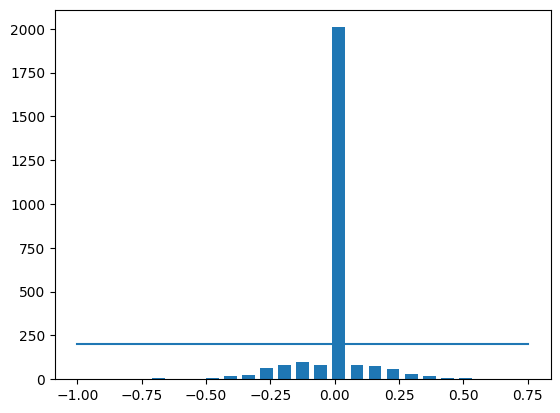

In [ ]:
plt.bar(center, hist, width = 0.05)
samples_per_bin = 200
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data:', len(data))

total data: 2674


In [ ]:
from sklearn.utils import shuffle
remove_list = []

for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)


In [ ]:
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 1808
remaining: 866


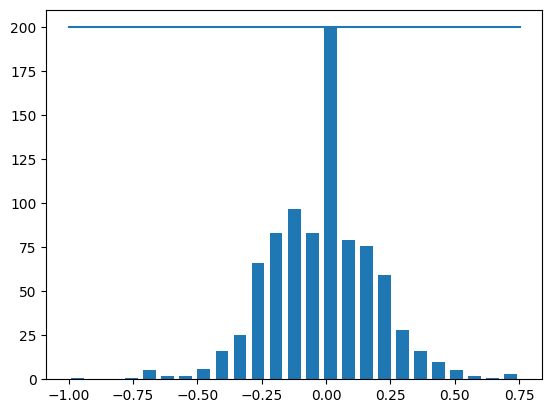

In [ ]:
  hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
import os  # os 패키지를 가져옵니다. 파일 및 디렉토리 경로를 다루는 데 사용합니다.
from sklearn.model_selection import train_test_split  # train_test_split 함수를 가져옵니다.

print(len(data))  # data의 길이(행의 수)를 출력합니다.
print(data.iloc[1])  # data의 두 번째 행을 출력합니다.

def load_img_steering(datadir, df):  # 이미지와 조향 각도를 로드하는 함수를 정의합니다.
  image_path = []  # 이미지 경로를 저장할 빈 리스트를 만듭니다.
  steering = []  # 조향 각도를 저장할 빈 리스트를 만듭니다.
  for i in range(len(data)):  # 데이터의 길이만큼 반복합니다.
    indexed_data = data.iloc[i]  # i번째 행의 데이터를 가져옵니다.
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]  # 중앙, 왼쪽, 오른쪽 이미지를 가져옵니다.
    image_path.append(os.path.join(datadir, center.strip()))  # 중앙 이미지의 경로를 추가합니다.
    steering.append(float(indexed_data[3]))  # 조향 각도를 추가합니다.
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))  # 왼쪽 이미지의 경로를 추가합니다.
    steering.append(float(indexed_data[3])+0.15)  # 조향 각도에 0.15를 더하여 추가합니다.
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))  # 오른쪽 이미지의 경로를 추가합니다.
    steering.append(float(indexed_data[3])-0.15)  # 조향 각도에서 0.15를 뺀 값을 추가합니다.
  image_paths = np.asarray(image_path)  # 이미지 경로 리스트를 numpy 배열로 변환합니다.
  steerings = np.asarray(steering)  # 조향 각도 리스트를 numpy 배열로 변환합니다.
  return image_paths, steerings  # 이미지 경로와 조향 각도를 반환합니다.

datadir = 'track'  # 데이터 디렉토리를 설정합니다.

image_paths, steerings = load_img_steering(datadir + '/IMG', data)  # 함수를 호출하여 이미지 경로와 조향 각도를 로드합니다.
len(image_paths), len(steerings)  # 이미지 경로의 수와 조향 각도의 수를 출력합니다.


866
center      center_2023_08_21_17_45_38_330.jpg
left        left_2023_08_21_17_45_38_330.jpg  
right       right_2023_08_21_17_45_38_330.jpg 
steering    0.0                               
throttle    0.0                               
reverse     0.0                               
speed       0.000079                          
Name: 3, dtype: object


(2598, 2598)

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

print('훈련 샘플 개수: {}\n검증 샘플 개수: {}'.format(len(X_train), len(X_valid)))


훈련 샘플 개수: 2078
검증 샘플 개수: 520


Text(0.5, 1.0, 'Test')

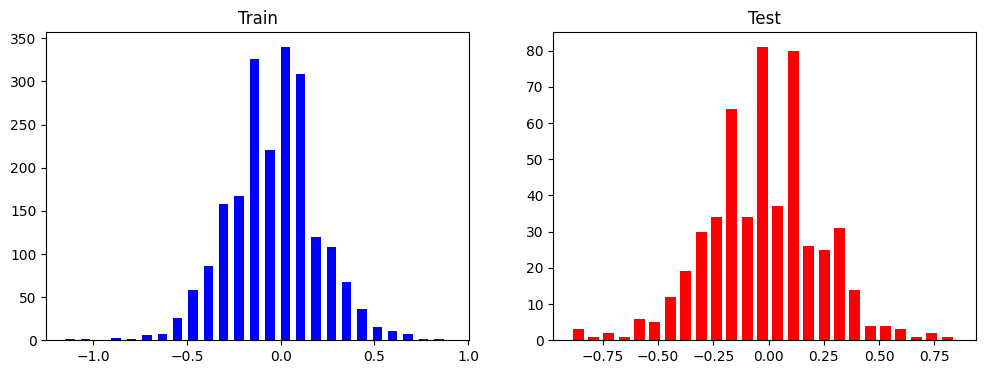

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Train')

axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Test')

Data Augmentation

Text(0.5, 1.0, 'Zoomed Image')

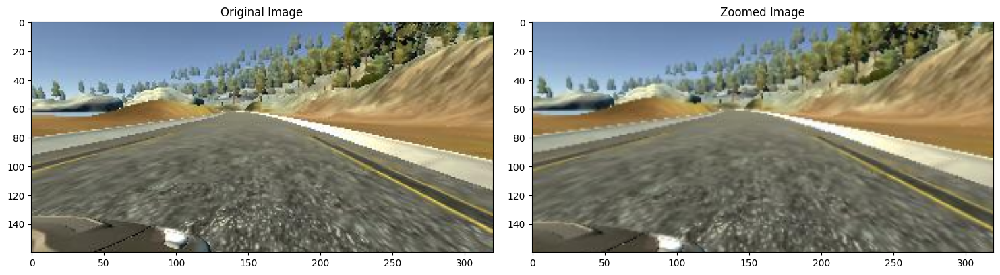

In [ ]:
import matplotlib.image as mpimg
from imgaug import augmenters as iaa

def zoom(image):  # 이미지를 줌하는 함수를 정의합니다.
  zoom = iaa.Affine(scale=(1, 1.3))  # 줌 비율을 설정합니다.
  image = zoom.augment_image(image)  # 설정한 비율로 이미지를 줌합니다.
  return image


image = image_paths[random.randint(0, 1000)]  # 무작위로 이미지 경로를 선택합니다.
original_image = mpimg.imread(image)  # 원본 이미지를 불러옵니다.
zoomed_image = zoom(original_image)  # 원본 이미지를 줌합니다.

fig, axs = plt.subplots(1, 2, figsize=(15, 10))  # 1행 2열의 서브플롯을 생성합니다.
fig.tight_layout()  # 플롯의 레이아웃을 최적화합니다.

axs[0].imshow(original_image)  # 원본 이미지를 출력합니다.
axs[0].set_title('Original Image')  # 첫 번째 서브플롯의 제목을 설정합니다.

axs[1].imshow(zoomed_image)  # 줌한 이미지를 출력합니다.
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, '이동된 이미지')

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 48376 (\N{HANGUL SYLLABLE BON}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from current font.
  func(*args

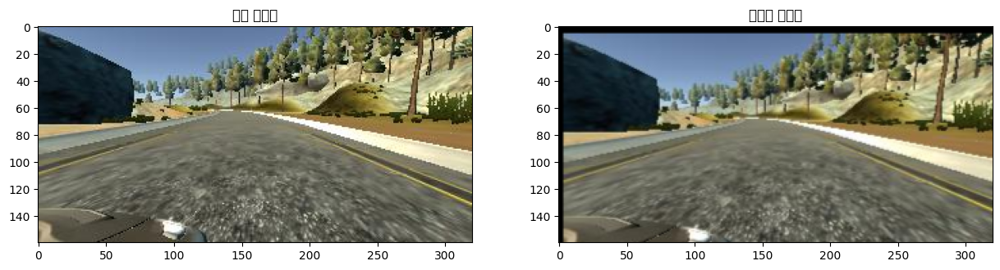

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]

# 선택된 이미지를 원본 이미지로 읽어옵니다.
original_image = mpimg.imread(image)

# pan 함수를 사용하여 원본 이미지를 이동시킵니다.
panned_image = pan(original_image)

# 1행 2열로 서브플롯(subplot)을 생성하고 크기를 (15, 10)로 설정합니다.
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# 첫 번째 서브플롯(왼쪽)에 원본 이미지를 출력합니다.
axs[0].imshow(original_image)
axs[0].set_title('원본 이미지')

# 두 번째 서브플롯(오른쪽)에 이동된 이미지를 출력합니다.
axs[1].imshow(panned_image)
axs[1].set_title('이동된 이미지')

Text(0.5, 1.0, 'Brightness altered image ')

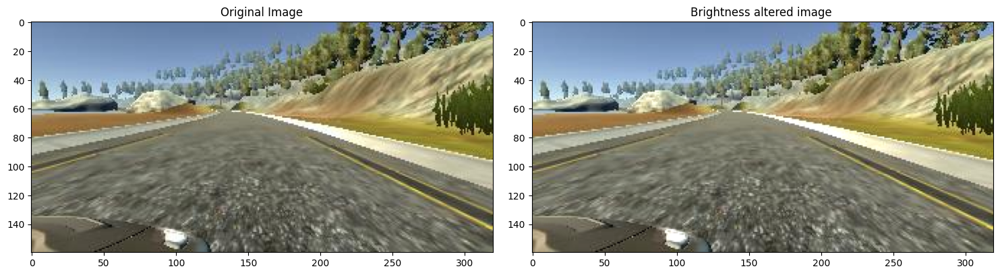

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]

original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')


Text(0.5, 1.0, '뒤집힌 이미지 - 조향 각도:-0.0')

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 51312 (\N{HANGUL SYLLABLE JO}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 54693 (\N{HANGUL SYLLABLE HYANG}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 44033 (\N{HANGUL SYLLABLE GAG}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 46244 (\N{HANGUL SYLLABLE DWI}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 51665 (\N{HANGUL SYLLABLE JIB}) missing from current font.
  func(*ar

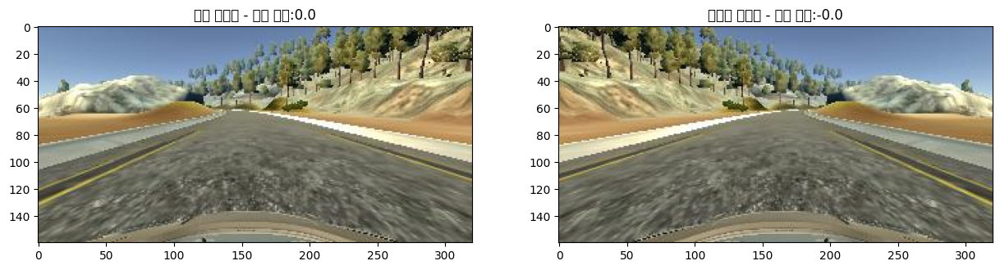

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

# 선택된 이미지를 원본 이미지로 읽어옵니다.
original_image = mpimg.imread(image)

# img_random_flip 함수를 사용하여 원본 이미지와 조향 각도를 랜덤하게 뒤집습니다.
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

# 1행 2열로 서브플롯(subplot)을 생성하고 크기를 (15, 10)로 설정합니다.
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# 첫 번째 서브플롯(왼쪽)에 원본 이미지를 출력하고 해당 이미지의 조향 각도를 함께 표시합니다.
axs[0].imshow(original_image)
axs[0].set_title('원본 이미지 - ' + '조향 각도:' + str(steering_angle))

# 두 번째 서브플롯(오른쪽)에 뒤집힌 이미지를 출력하고 해당 이미지의 뒤집힌 조향 각도를 함께 표시합니다.
axs[1].imshow(flipped_image)
axs[1].set_title('뒤집힌 이미지 - ' + '조향 각도:' + str(flipped_steering_angle))

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)  #
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 48376 (\N{HANGUL SYLLABLE BON}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 54872 (\N{HANGUL SYLLABLE HWAN}) missing from current font.
  fig.tight_layout()
<ipython-input-22-155fb4381c38>:19: UserWarning: Glyph 

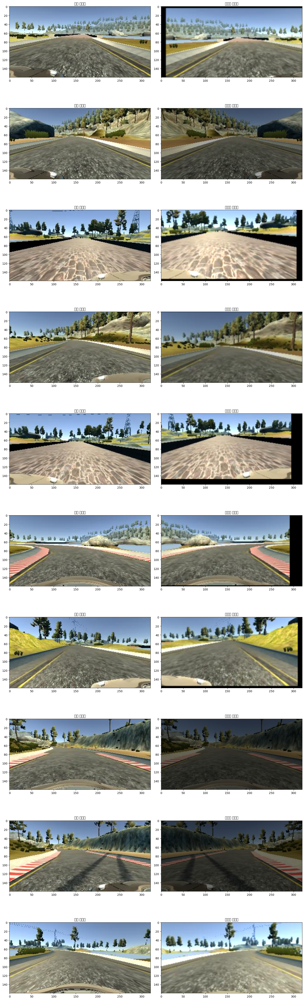

In [ ]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)

    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("원본 이미지")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("변환된 이미지")

fig.tight_layout()
plt.show()

In [ ]:
def img_preprocess(img):
    img = img[60:135,:,:]  # 이미지의 상단과 하단을 제거하여 관심 영역을 설정합니다.
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)  # 이미지를 RGB에서 YUV로 변환합니다.
    img = cv2.GaussianBlur(img, (3, 3), 0)  # 가우시안 블러를 적용하여 이미지를 부드럽게 합니다.
    img = cv2.resize(img, (200, 66))  # 이미지 크기를 (200, 66)으로 조정합니다.
    img = img/255  # 이미지를 정규화하여 값의 범위를 [0, 1]로 맞춥니다.
    return img

Text(0.5, 1.0, '전처리된 이미지')

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 52376 (\N{HANGUL SYLLABLE CEO}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52376 (\N{HANGUL SYLLABLE CEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47532 (\N{HANGUL 

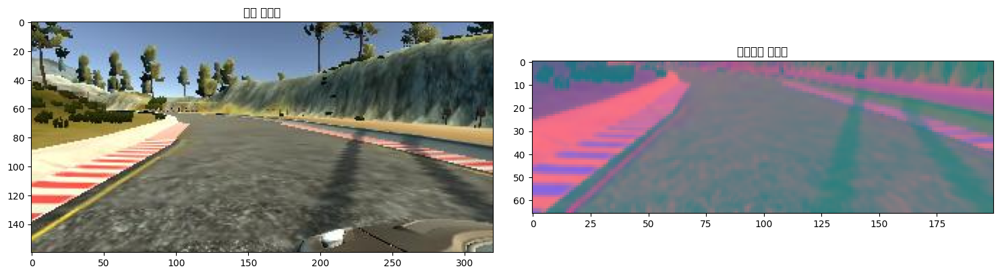

In [ ]:
# 이미지 경로를 통해 이미지를 읽어옵니다.
image = image_paths[100]
original_image = mpimg.imread(image)

# 이미지를 전처리하여 preprocessed_image에 저장합니다.
preprocessed_image = img_preprocess(original_image)

# 시각화를 위한 subplot 생성
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# 원본 이미지와 전처리된 이미지를 시각화합니다.
axs[0].imshow(original_image)
axs[0].set_title('원본 이미지')
axs[1].imshow(preprocessed_image)
axs[1].set_title('전처리된 이미지')

# Batch Generator

Text(0.5, 1.0, '검증 이미지')

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 54984 (\N{HANGUL SYLLABLE HUN}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 47144 (\N{HANGUL SYLLABLE RYEON}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 44160 (\N{HANGUL SYLLABLE GEOM}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 51613 (\N{HANGUL SYLLABLE JEUNG}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54984 (\N{HANGUL SYLLABLE HUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47144 (\N{HANGUL SYLLABLE RYEON}) mi

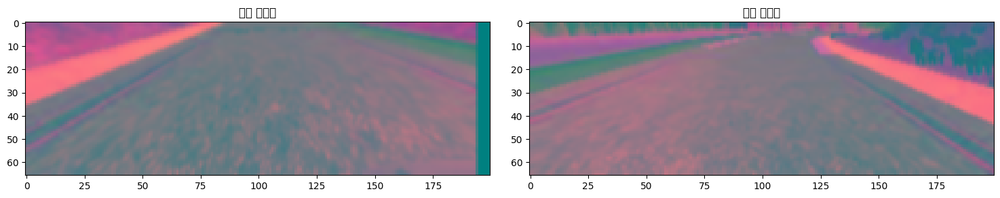

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                # 훈련 모드일 때 이미지를 무작위로 변환하여 가져옵니다.
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

            else:
                # 검증 또는 테스트 모드일 때 원본 이미지와 조향 각도를 가져옵니다.
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            # 이미지를 전처리합니다.
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

# 훈련 데이터와 검증 데이터의 첫 번째 배치를 생성합니다.
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

# 시각화를 위한 subplot 생성
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# 훈련 데이터와 검증 데이터의 첫 번째 배치를 시각화합니다.
axs[0].imshow(x_train_gen[0])
axs[0].set_title('훈련 이미지')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('검증 이미지')

In [ ]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, 5, strides=2, input_shape=(66, 200, 3), activation='relu'))
    model.add(Conv2D(36, 5, strides=2, activation='relu'))
    model.add(Conv2D(48, 5, strides=2, activation='relu'))
    model.add(Conv2D(64, 3, activation='relu'))
    model.add(Conv2D(64, 3, activation='relu'))
    #   model.add(Dropout(0.5))


    model.add(Flatten())

    model.add(Dense(100, activation = 'relu'))
    #   model.add(Dropout(0.5))

    model.add(Dense(50, activation = 'relu'))
    #   model.add(Dropout(0.5))

    model.add(Dense(10, activation = 'relu'))
    #   model.add(Dropout(0.5))

    model.add(Dense(1))

    optimizer = Adam(learning_rate=0.001)

    model.compile(loss='mse', optimizer=optimizer)

    return model

model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [ ]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 [==============================] - 1375s 5s/step - loss: 0.0420 - val_loss: 0.0230
Epoch 2/10
300/300 [==============================] - 213s 714ms/step - loss: 0.0298 - val_loss: 0.0228
Epoch 3/10
300/300 [==============================] - 181s 606ms/step - loss: 0.0255 - val_loss: 0.0205
Epoch 4/10
300/300 [==============================] - 212s 710ms/step - loss: 0.0230 - val_loss: 0.0205
Epoch 5/10
300/300 [==============================] - 180s 602ms/step - loss: 0.0220 - val_loss: 0.0186
Epoch 6/10
300/300 [==============================] - 213s 712ms/step - loss: 0.0202 - val_loss: 0.0180
Epoch 7/10
300/300 [==============================] - 182s 608ms/step - loss: 0.0199 - val_loss: 0.0169
Epoch 8/10
300/300 [==============================] - 174s 581ms/step - loss: 0.0189 - val_loss: 0.0168
Epoch 9/10
300/300 [==============================] - 171s 570ms/step - loss: 0.0179 - val_loss: 0.0174
Epoch 10/10
300/300 [==============================] - 205s 684ms/

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>